In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, RobustScaler
from sklearn.model_selection import train_test_split

In [4]:
# Load dataset
data = r'C:\Users\ASUS\Desktop\data\indian_liver_patient.csv'
df = pd.read_csv(data)
df.columns = df.columns.map(lambda x : x.lower())
#df.columns = df.columns.apply(lambda x : x.lower())
df.head()

,age,gender,total_bilirubin,direct_bilirubin,alkaline_phosphotase,alamine_aminotransferase,aspartate_aminotransferase,total_protiens,albumin,albumin_and_globulin_ratio,dataset
0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,72,Male,3.9,2.0,195,27,59,7.3,2.4,0.40,1


In [6]:
#df.info()
#df.describe(include='all')

In [8]:
df["albumin_and_globulin_ratio"] = df["albumin_and_globulin_ratio"].fillna(df["albumin_and_globulin_ratio"].mean())

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 11 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         583 non-null    int64  
 1   gender                      583 non-null    object 
 2   total_bilirubin             583 non-null    float64
 3   direct_bilirubin            583 non-null    float64
 4   alkaline_phosphotase        583 non-null    int64  
 5   alamine_aminotransferase    583 non-null    int64  
 6   aspartate_aminotransferase  583 non-null    int64  
 7   total_protiens              583 non-null    float64
 8   albumin                     583 non-null    float64
 9   albumin_and_globulin_ratio  583 non-null    float64
 10  dataset                     583 non-null    int64  
dtypes: float64(5), int64(5), object(1)
memory usage: 50.2+ KB


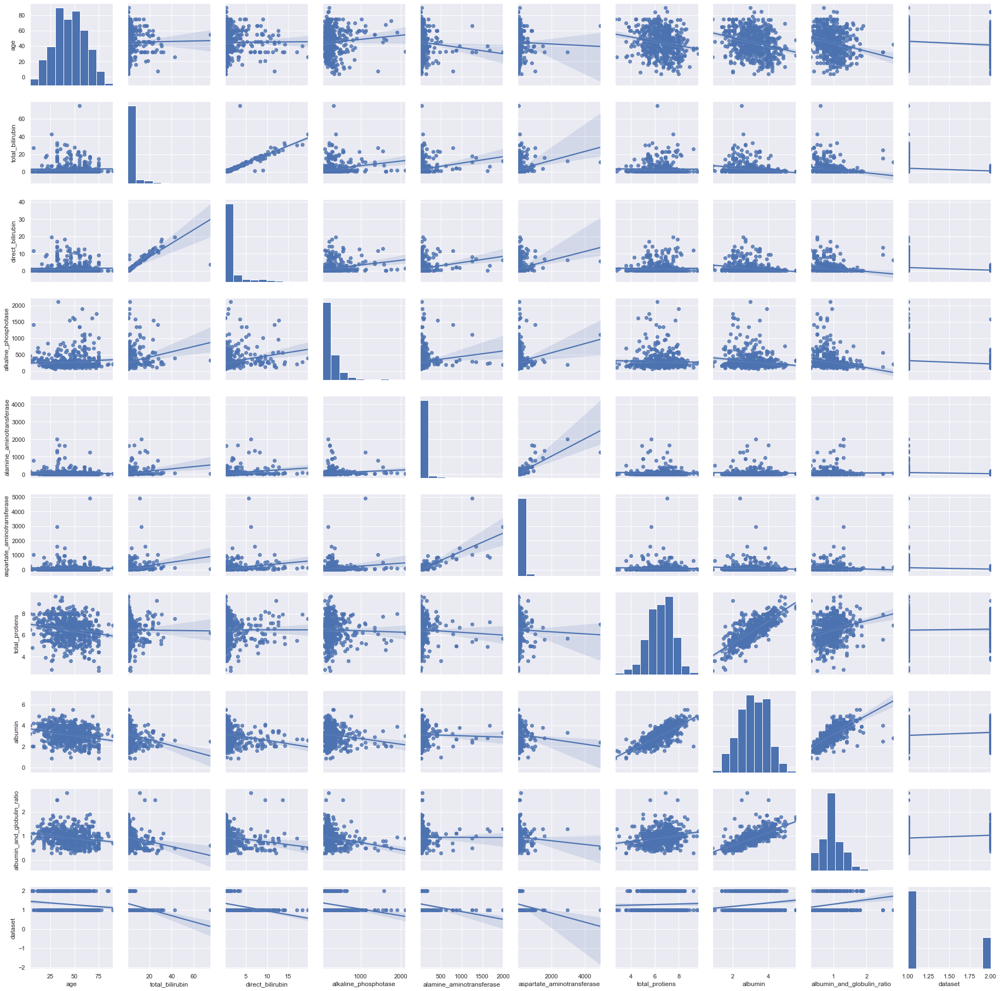

In [12]:
sns.set()
sns.pairplot(df, kind='reg')

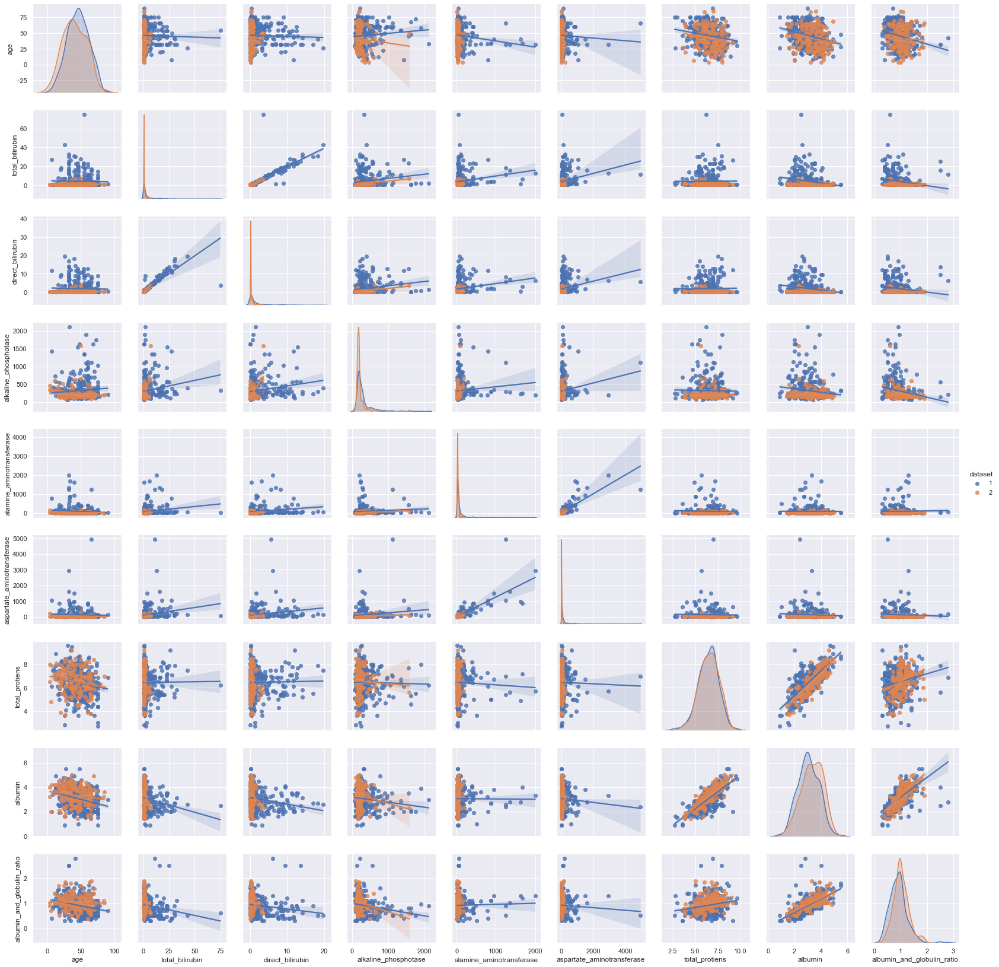

In [14]:
sns.set()
sns.pairplot(df, hue="dataset", kind="reg")

In [16]:
df.corr()["dataset"]

age                          -0.137351
total_bilirubin              -0.220208
direct_bilirubin             -0.246046
alkaline_phosphotase         -0.184866
alamine_aminotransferase     -0.163416
aspartate_aminotransferase   -0.151934
total_protiens                0.035008
albumin                       0.161388
albumin_and_globulin_ratio    0.162319
dataset                       1.000000
Name: dataset, dtype: float64

In [18]:
df.corr().style.background_gradient(cmap="viridis")

,age,total_bilirubin,direct_bilirubin,alkaline_phosphotase,alamine_aminotransferase,aspartate_aminotransferase,total_protiens,albumin,albumin_and_globulin_ratio,dataset
age,1.000000,0.011763,0.007529,0.080425,-0.086883,-0.019910,-0.187461,-0.265924,-0.216089,-0.137351
total_bilirubin,0.011763,1.000000,0.874618,0.206669,0.214065,0.237831,-0.008099,-0.222250,-0.206159,-0.220208
direct_bilirubin,0.007529,0.874618,1.000000,0.234939,0.233894,0.257544,-0.000139,-0.228531,-0.200004,-0.246046
alkaline_phosphotase,0.080425,0.206669,0.234939,1.000000,0.125680,0.167196,-0.028514,-0.165453,-0.233960,-0.184866
alamine_aminotransferase,-0.086883,0.214065,0.233894,0.125680,1.000000,0.791966,-0.042518,-0.029742,-0.002374,-0.163416
aspartate_aminotransferase,-0.019910,0.237831,0.257544,0.167196,0.791966,1.000000,-0.025645,-0.085290,-0.070024,-0.151934
total_protiens,-0.187461,-0.008099,-0.000139,-0.028514,-0.042518,-0.025645,1.000000,0.784053,0.233904,0.035008
albumin,-0.265924,-0.222250,-0.228531,-0.165453,-0.029742,-0.085290,0.784053,1.000000,0.686322,0.161388
albumin_and_globulin_ratio,-0.216089,-0.206159,-0.200004,-0.233960,-0.002374,-0.070024,0.233904,0.686322,1.000000,0.162319
dataset,-0.137351,-0.220208,-0.246046,-0.184866,-0.163416,-0.151934,0.035008,0.161388,0.162319,1.000000


In [20]:
df.drop(['direct_bilirubin', 'aspartate_aminotransferase', 'total_protiens', 'albumin'], axis=1, inplace=True)

KeyError: "['direct_bilirubin' 'aspartate_aminotransferase' 'total_protiens'\n 'albumin'] not found in axis"

In [23]:
df.corr().style.background_gradient(cmap="viridis")

,age,total_bilirubin,alkaline_phosphotase,alamine_aminotransferase,albumin_and_globulin_ratio,dataset
age,1.000000,0.011763,0.080425,-0.086883,-0.216089,-0.137351
total_bilirubin,0.011763,1.000000,0.206669,0.214065,-0.206159,-0.220208
alkaline_phosphotase,0.080425,0.206669,1.000000,0.125680,-0.233960,-0.184866
alamine_aminotransferase,-0.086883,0.214065,0.125680,1.000000,-0.002374,-0.163416
albumin_and_globulin_ratio,-0.216089,-0.206159,-0.233960,-0.002374,1.000000,0.162319
dataset,-0.137351,-0.220208,-0.184866,-0.163416,0.162319,1.000000


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 583 entries, 0 to 582
Data columns (total 7 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   age                         583 non-null    int64  
 1   gender                      583 non-null    object 
 2   total_bilirubin             583 non-null    float64
 3   alkaline_phosphotase        583 non-null    int64  
 4   alamine_aminotransferase    583 non-null    int64  
 5   albumin_and_globulin_ratio  583 non-null    float64
 6   dataset                     583 non-null    int64  
dtypes: float64(2), int64(4), object(1)
memory usage: 32.0+ KB


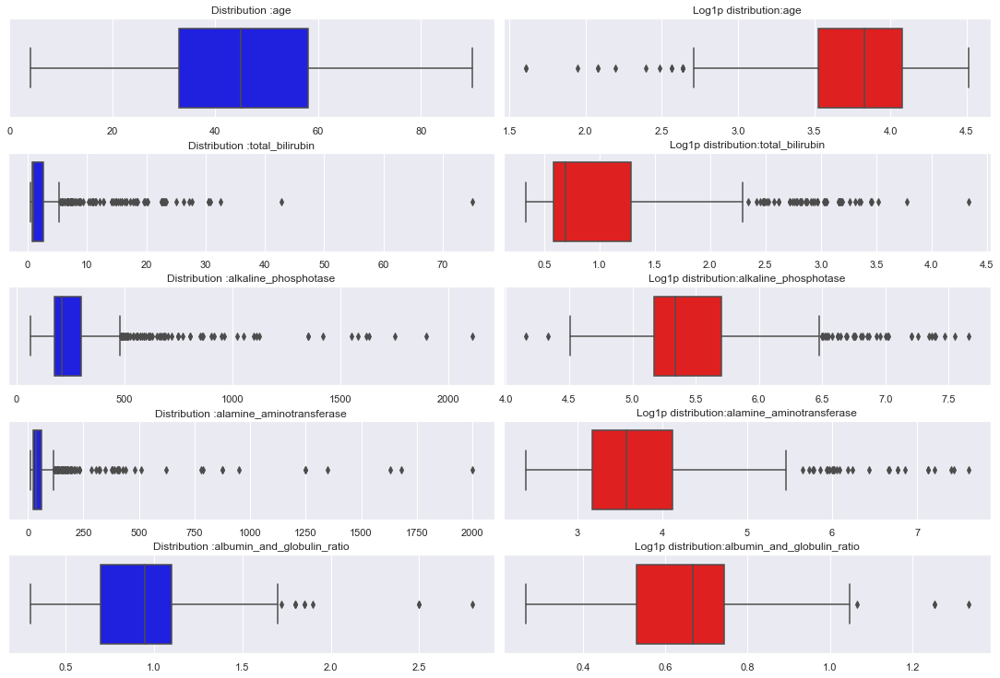

In [27]:
# outlier check
plt.figure(figsize=(15,20))

for i, c in enumerate(df.drop("dataset", axis=1).select_dtypes(include="number").columns):
    plt.subplot(10, 2, i*2 +1)
    sns.boxplot(df[c], color="blue")
    plt.title("Distribution :" + c)
    plt.xlabel('')
    plt.tight_layout(pad=0.4)

    plt.subplot(10, 2, i*2 +2)
    sns.boxplot(df[c].apply('log1p'), color="red")
    plt.xlabel('')
    plt.title('Log1p distribution:' + c)


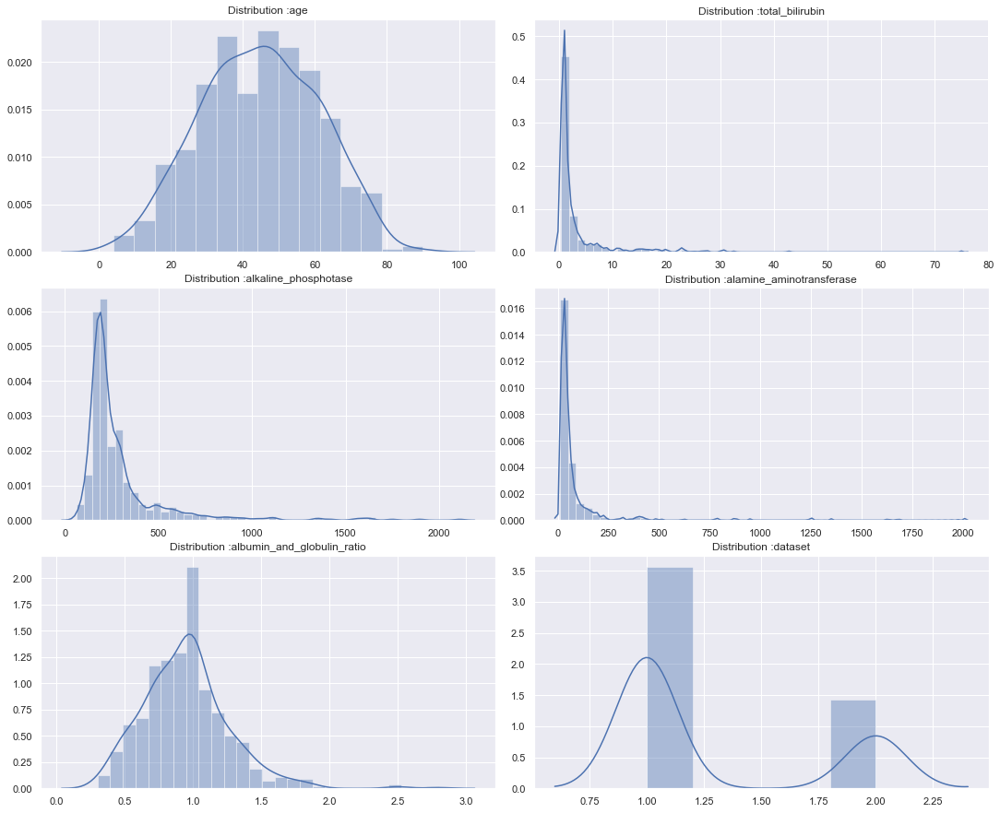

In [29]:
plt.figure(figsize=(15,20))

for i, c in enumerate(df.select_dtypes(include="number").columns):
    plt.subplot(5, 2, i+1)
    sns.distplot(df[c])
    plt.title("Distribution :" + c)
    plt.xlabel("")
    plt.tight_layout(pad=0.4)

In [31]:
# Strongly skewed features :  total_bilirubin, alkaline_phosphotase, alamine_aminotransferase, albumin_and_globulin_ratio
# Save skewed features
skewed_col = df[["total_bilirubin", "alkaline_phosphotase", "alamine_aminotransferase", "albumin_and_globulin_ratio"]]

In [33]:
# Apply log1p transformation just selected columns
for c in skewed_col:
    df[c] = df[c].apply("log1p")

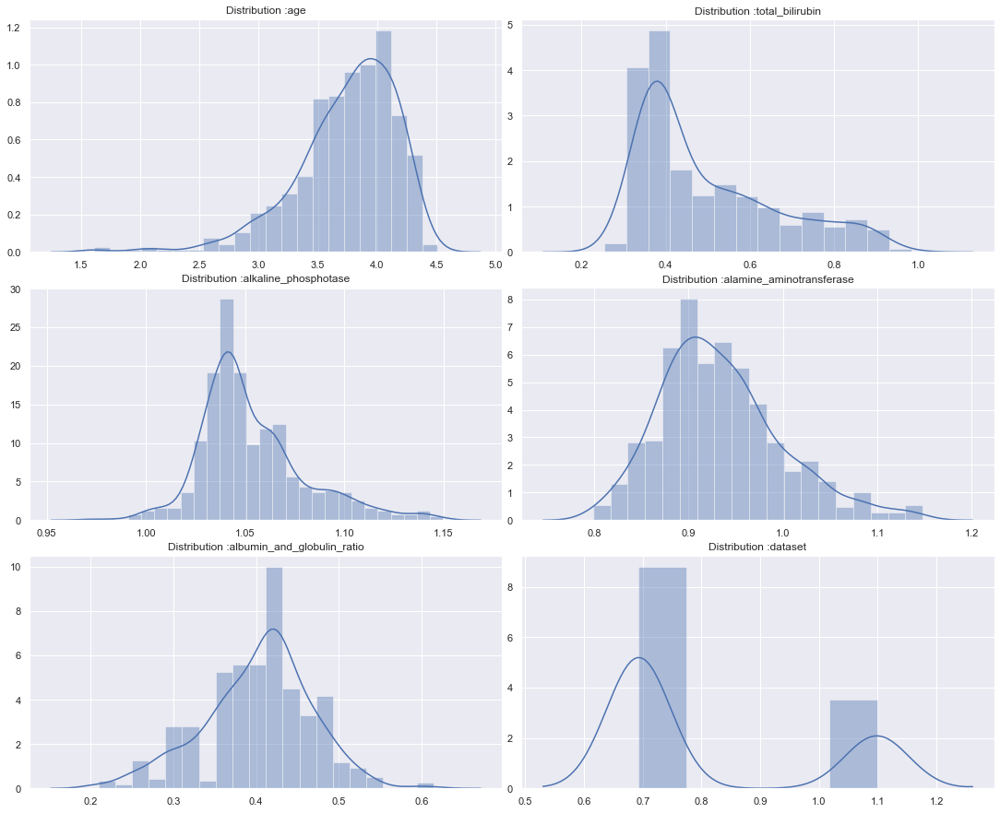

In [35]:
plt.figure(figsize=(15,20))

for i, c in enumerate(df.select_dtypes(include="number").columns):
    plt.subplot(5, 2, i+1)
    sns.distplot(df[c].apply("log1p"))
    plt.title("Distribution :" + c)
    plt.xlabel("")
    plt.tight_layout(pad=0.4)

In [37]:
df.head()

,age,gender,total_bilirubin,alkaline_phosphotase,alamine_aminotransferase,albumin_and_globulin_ratio,dataset
0,65,0,0.425678,1.830410,1.343703,0.495826,1
1,62,1,1.246037,2.021691,1.643721,0.440758,1
2,62,1,1.136632,1.973587,1.631370,0.492607,1
3,58,1,0.526589,1.826078,1.310506,0.526589,1
4,72,1,0.951363,1.837070,1.466077,0.290033,1


In [39]:
# Scale
le = LabelEncoder()
df["gender"] = le.fit_transform(df["gender"])
df["gender"].head()

0    0
1    1
2    1
3    1
4    1
Name: gender, dtype: int64

In [41]:
rs = RobustScaler()
for i in df.iloc[:, :-1].columns:
    df[i] = rs.fit_transform(df[i].values.reshape(-1,1))
df.head()

,age,gender,total_bilirubin,alkaline_phosphotase,alamine_aminotransferase,albumin_and_globulin_ratio,dataset
0,0.80,-1.0,-0.278571,-0.205486,-0.880118,-0.114392,1
1,0.68,0.0,1.986087,2.128984,0.596977,-0.540218,1
2,0.68,0.0,1.684067,1.541908,0.536171,-0.139286,1
3,0.52,0.0,0.000000,-0.258352,-1.043561,0.123492,1
4,1.08,0.0,1.172617,-0.124206,-0.277631,-1.705740,1


In [42]:
df.to_csv("data.csv", index=False)

clean_data = pd.read_csv("data.csv")
clean_data.head()

,age,gender,total_bilirubin,alkaline_phosphotase,alamine_aminotransferase,albumin_and_globulin_ratio,dataset
0,0.80,-1.0,-0.278571,-0.205486,-0.880118,-0.114392,1
1,0.68,0.0,1.986087,2.128984,0.596977,-0.540218,1
2,0.68,0.0,1.684067,1.541908,0.536171,-0.139286,1
3,0.52,0.0,0.000000,-0.258352,-1.043561,0.123492,1
4,1.08,0.0,1.172617,-0.124206,-0.277631,-1.705740,1


array([1, 1, 2, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 2, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 1, 2,
       1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 1, 2, 2, 2, 1, 1,
       2, 1, 1, 1, 1, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1,
       1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1,
       2, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 2, 1,
       2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2,
       1, 1, 2, 1, 1, 2, 2, 2, 1, 1, 1, 2, 1, 2, 1, 1, 2, 1, 1, 2, 2, 1,
       2, 1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1,
       1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 2,